### 1. Повнозв'язні мережі. Вирішіть завдання класифікації даних, з якими працювали в Лабораторній №1

In [1]:
import math
import shutil

import keras
from keras.src.applications.efficientnet import EfficientNetB0
from keras.src.callbacks import EarlyStopping, History, ModelCheckpoint
from keras.src.utils import to_categorical
from keras.src.utils.module_utils import tensorflow
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
import pandas as pd
from keras import Sequential, Input
from keras.src.layers import Dense
from matplotlib import pyplot as plt

2024-12-27 22:26:52.419100: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1735331212.490523  556940 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1735331212.515417  556940 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-27 22:26:52.624528: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
df = pd.read_csv("../train.csv")
df

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


In [3]:
x = df.drop('price_range', axis=1)
y = to_categorical(df['price_range'])

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1)

scaler = StandardScaler()
scaler.fit(x_train)

scaled_x_train = scaler.transform(x_train)
scaled_x_test = scaler.transform(x_test)

to_test = {
    'layers': [[128, 64, 32, 16, 4], [256, 128, 32, 16, 4], [1024, 512, 64, 32, 16, 4]],
    'activation': ['relu', 'leaky_relu'],
    'optimizer': ['adam', 'nadam', 'rmsprop']
}


In [4]:
scaled_x_train, validation_data_x, y_train, validation_data_y = train_test_split(scaled_x_train, y_train, test_size=0.2)

all_epochs = []
all_losses = []
all_val_losses = []
all_accuracies = []
i = 0
mx = None
for layer in to_test['layers']:
    for activation in to_test['activation']:
        for optimizer in to_test['optimizer']:
            model = Sequential()
            model.add(Input((x.shape[1],)))
            for l in layer:
                model.add(Dense(l, activation=activation if l != 4 else 'softmax'))
            model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
            epoch_train = model.fit(scaled_x_train,
                                    y_train,
                                    validation_data=(validation_data_x, validation_data_y),
                                    epochs=100,
                                    verbose=0,
                                    batch_size=32,
                                    callbacks=EarlyStopping(monitor='val_loss', patience=5),
                                    validation_split=0.2)
            history_dict = epoch_train.history
            all_losses.append(history_dict["loss"])
            all_val_losses.append(history_dict["val_loss"])
            all_epochs.append(range(1, len(history_dict["loss"]) + 1))
            acc = model.evaluate(scaled_x_test, y_test, verbose=0)[1]
            all_accuracies.append(acc)
            if mx is None:
                mx = [acc, i, layer[0], activation, optimizer]
            else:
                mx = [acc, i, layer[0], activation, optimizer] if mx[0] < acc else mx
            i += 1

I0000 00:00:1735331216.240126  556940 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5558 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3070 Ti, pci bus id: 0000:2d:00.0, compute capability: 8.6
I0000 00:00:1735331217.787220  557133 service.cc:148] XLA service 0x7f1700005ca0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1735331217.787368  557133 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce RTX 3070 Ti, Compute Capability 8.6
2024-12-27 22:26:57.835206: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1735331217.968853  557133 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1735331219.490178  557133 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
2024-12-27 22:27:31.987234: I extern

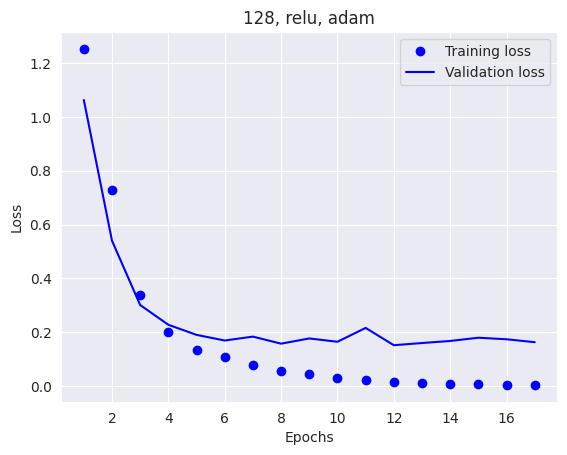

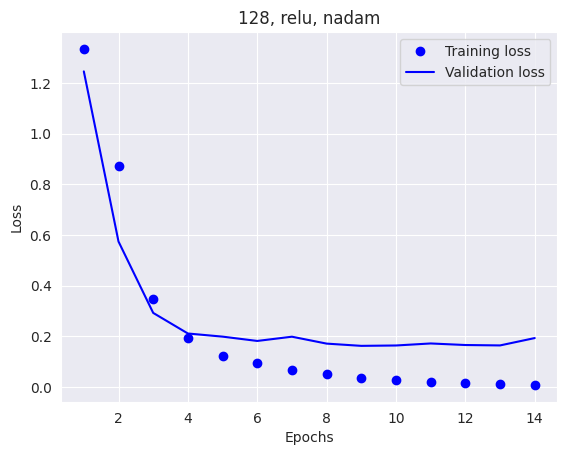

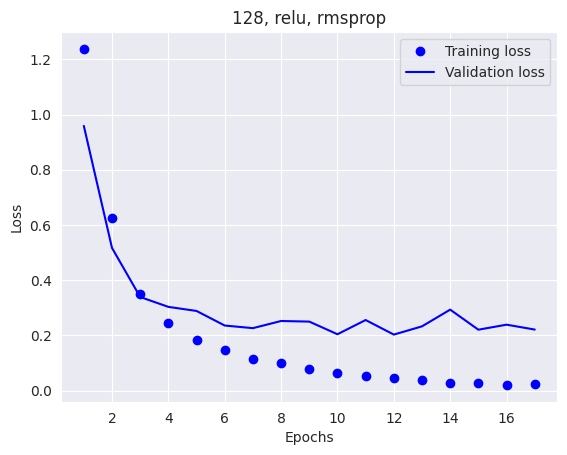

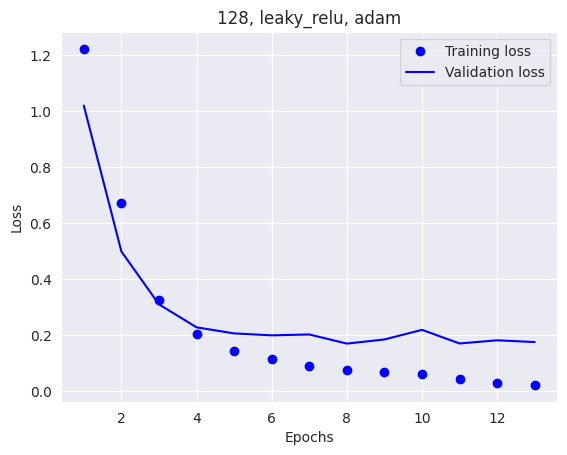

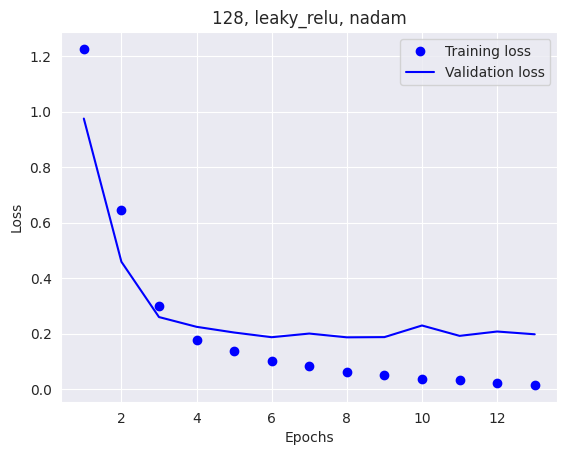

...

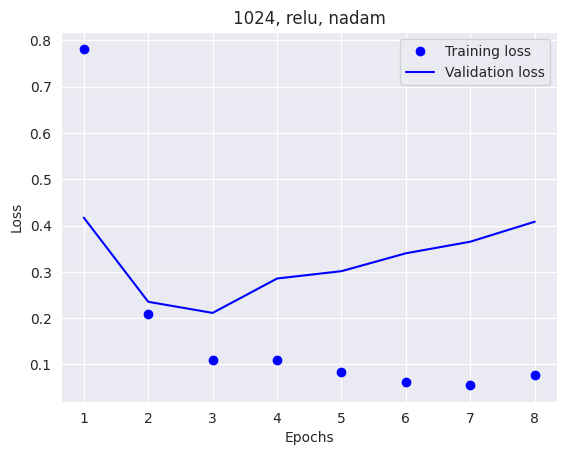

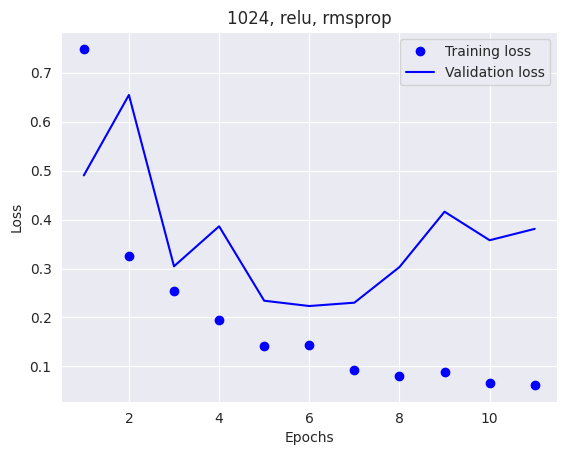

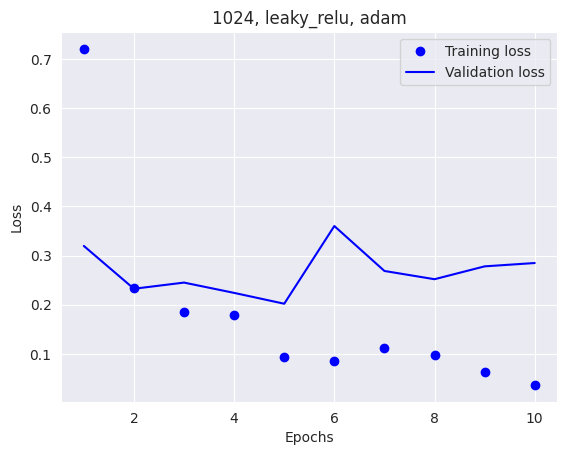

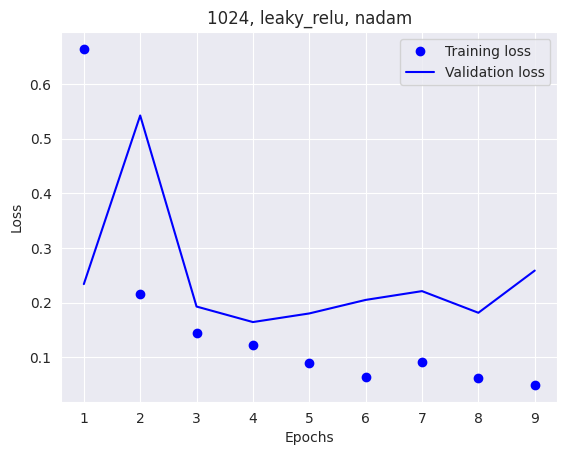

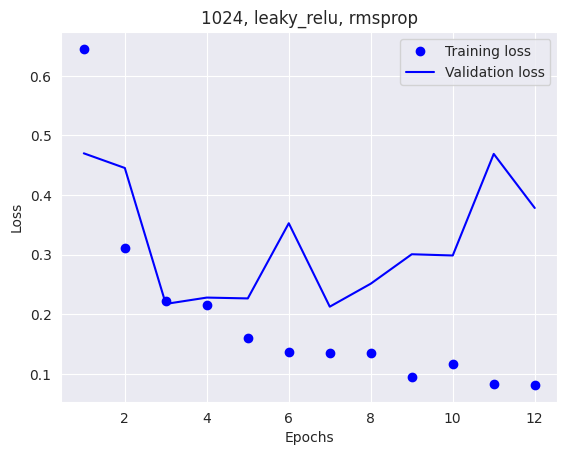

In [5]:
i = 0
naming = []
def show_history_plot(history_dict):
    lv = history_dict["loss"]
    vlv = history_dict["val_loss"]
    epch = range(1, len(lv) + 1)
    plt.plot(epch, lv, "bo", label="Training loss")
    plt.plot(epch, vlv, "b", label="Validation loss")
    plt.title("Training and validation loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()
for layer in to_test['layers']:
    for activation in to_test['activation']:
        for optimizer in to_test['optimizer']:
            loss_values = all_losses[i]
            val_loss_values = all_val_losses[i]
            epochs = range(1, len(loss_values) + 1)
            plt.plot(epochs, loss_values, "bo", label="Training loss")
            plt.plot(epochs, val_loss_values, "b", label="Validation loss")
            plt.title(f'{layer[0]}, {activation}, {optimizer}')
            plt.xlabel("Epochs")
            plt.ylabel("Loss")
            plt.legend()
            plt.show()
            i = i + 1
            naming.append([layer[0], activation, optimizer])

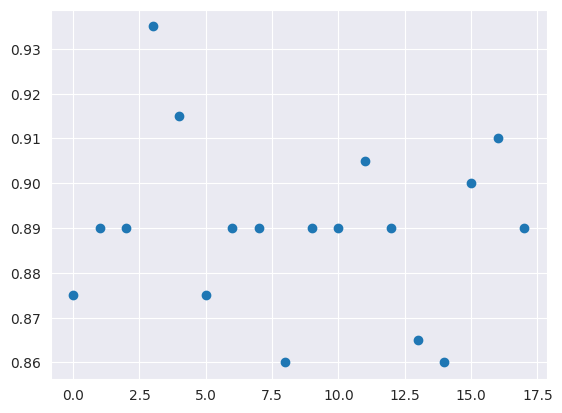

[0.9350000023841858, 3, 128, 'leaky_relu', 'adam']


[[128, 'relu', 'adam'],
 [128, 'relu', 'nadam'],
 [128, 'relu', 'rmsprop'],
 [128, 'leaky_relu', 'adam'],
 [128, 'leaky_relu', 'nadam'],
 [128, 'leaky_relu', 'rmsprop'],
 [256, 'relu', 'adam'],
 [256, 'relu', 'nadam'],
 [256, 'relu', 'rmsprop'],
 [256, 'leaky_relu', 'adam'],
 [256, 'leaky_relu', 'nadam'],
 [256, 'leaky_relu', 'rmsprop'],
 [1024, 'relu', 'adam'],
 [1024, 'relu', 'nadam'],
 [1024, 'relu', 'rmsprop'],
 [1024, 'leaky_relu', 'adam'],
 [1024, 'leaky_relu', 'nadam'],
 [1024, 'leaky_relu', 'rmsprop']]

In [6]:
import numpy as np

x_plt = np.arange(0, len(all_accuracies), 1)
plt.scatter(x_plt, np.array(all_accuracies))
plt.show()
print(mx)
naming

### Висновок: relu/leaky_relu + adam/nadam + 128/256 neurons max == SVN + GridSearch (флуктуація 2-3%)

### 2. Convolutional Neural Networks

In [7]:
import os, shutil

df = pd.read_csv('Training_set.csv') # https://www.kaggle.com/datasets/phucthaiv02/butterfly-image-classification

df_cp = df[df['label'].isin(df['label'].value_counts().head(5).index)]
# filenames = df[~df['filename'].isin(df_cp['filename'])]['filename'].apply(lambda d: os.remove(f'train/{d}'))
df = df_cp
df.reset_index(drop=True, inplace=True)
df.insert(0, 'encoded', LabelEncoder().fit_transform(df['label']))

#df[['filename', 'encoded']].apply(lambda im: shutil.move(f'train/{im["filename"]}', f'train/{im["encoded"]}/{im[0]}.jpg'), axis=1)
#df[['filename', 'encoded']].apply(lambda x: shutil.move(f'train/{x["encoded"]}/{x["filename"]}.jpg', f'train/{x["encoded"]}/{x["filename"]}'), axis=1)

df['fullpath'] = 'train/' + df['encoded'].astype(str) + '/' + df['filename']

df

,encoded,filename,label,fullpath
0,1,Image_3.jpg,BROWN SIPROETA,train/1/Image_3.jpg
1,1,Image_9.jpg,BROWN SIPROETA,train/1/Image_9.jpg
2,0,Image_30.jpg,ATALA,train/0/Image_30.jpg
3,3,Image_53.jpg,SCARCE SWALLOW,train/3/Image_53.jpg
4,3,Image_59.jpg,SCARCE SWALLOW,train/3/Image_59.jpg
...,...,...,...,...
529,1,Image_6467.jpg,BROWN SIPROETA,train/1/Image_6467.jpg
530,0,Image_6469.jpg,ATALA,train/0/Image_6469.jpg
531,0,Image_6482.jpg,ATALA,train/0/Image_6482.jpg
532,2,Image_6496.jpg,MOURNING CLOAK,train/2/Image_6496.jpg


### 2.1. From scratch

Found 534 files belonging to 5 classes.
Using 428 files for training.
Using 106 files for validation.


2024-12-27 22:28:34.157391: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2024-12-27 22:28:35.180633: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


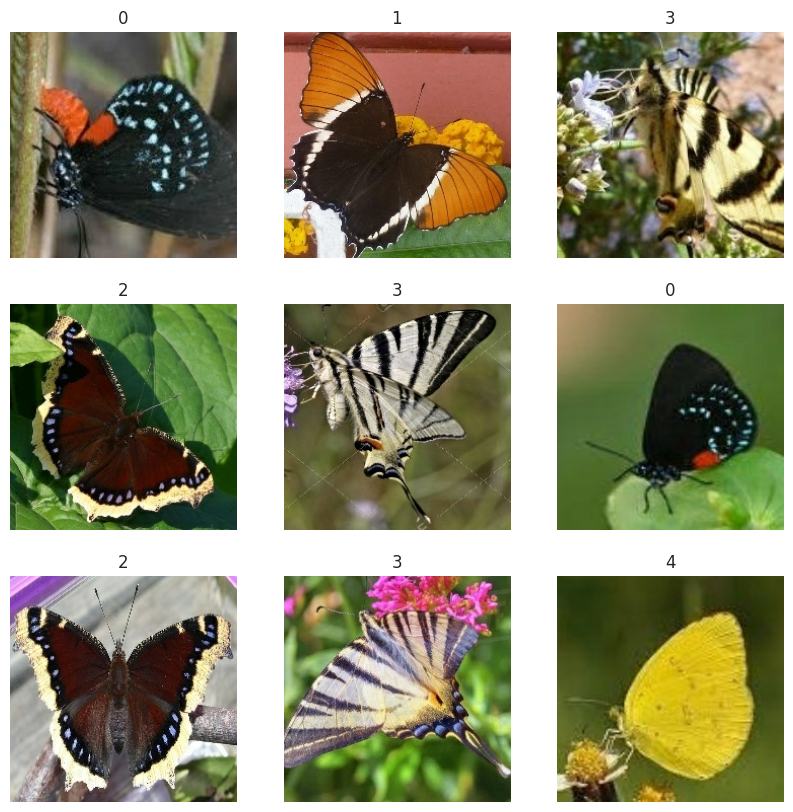

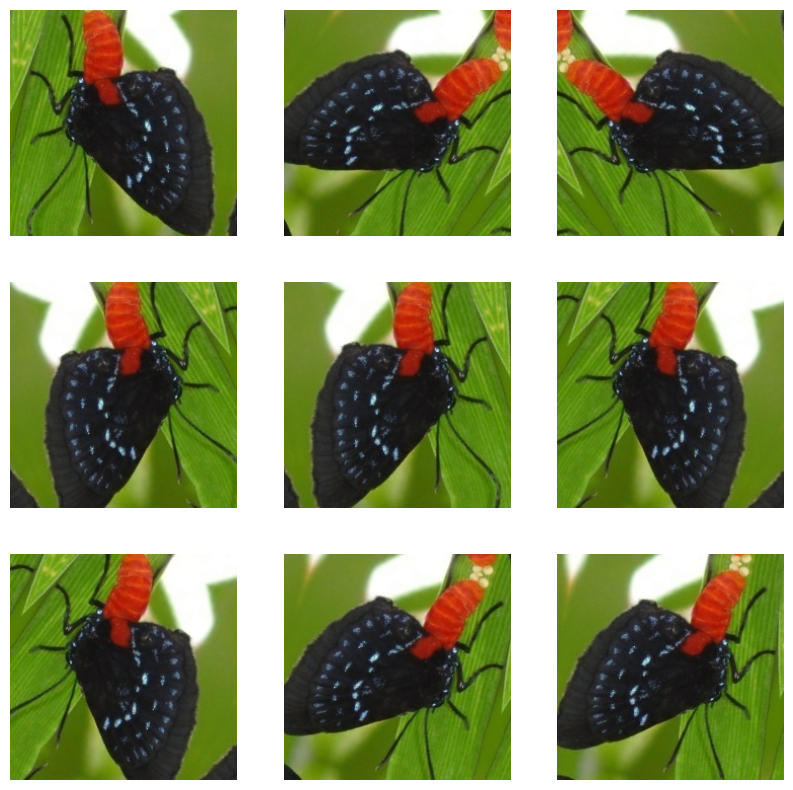

In [8]:
from keras.api import layers

batch = 32

train_ds, val_ds = keras.utils.image_dataset_from_directory(
    'train',
    batch_size=batch,
    subset='both',
    validation_split=0.2,
    seed=123,
    image_size=(224, 224)
)

data_augmentation_layers = [
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
]

def data_augmentation(ims):
    for lyr in data_augmentation_layers:
        ims = lyr(images)
    return ims

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(np.array(images[i]).astype("uint8"))
        plt.title(int(labels[i]))
        plt.axis("off")

plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(np.array(augmented_images[0]).astype("uint8"))
        plt.axis("off")

In [9]:
def create_model():
    inputs = layers.Input(shape=(224, 224, 3))

    x = layers.Rescaling(1./255)(inputs)
    x = layers.Conv2D(32, strides=1, padding='same', kernel_size=3)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    for size in [64, 128, 256, 512, 1024, 2048]:
        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)
        x = layers.Conv2D(size, strides=1, padding='same', kernel_size=3)(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)

    x = layers.GlobalAveragePooling2D()(x)

    x = layers.Dropout(0.25)(x)
    outputs = layers.Dense(5, activation='softmax')(x)

    return keras.Model(inputs=inputs, outputs=outputs)

In [10]:
model_50 = create_model()
model_300 = create_model()
model_50.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model_300.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

history_50 = model_50.fit(x=train_ds, validation_data=val_ds, epochs=50, verbose=0, callbacks=[ModelCheckpoint("butterflies_50_epochs.keras")])
history_300 = model_300.fit(x=train_ds, validation_data=val_ds, epochs=300, verbose=0, callbacks=[ModelCheckpoint("butterflies_300_epochs.keras")])

2024-12-27 22:28:41.654100: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:306] Allocator (GPU_0_bfc) ran out of memory trying to allocate 8.91GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-12-27 22:28:49.226856: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:306] Allocator (GPU_0_bfc) ran out of memory trying to allocate 8.67GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-12-27 22:28:53.622554: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_256', 4 bytes spill stores, 4 bytes spill loads

2024-12-27 22:28:53.753645: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled 

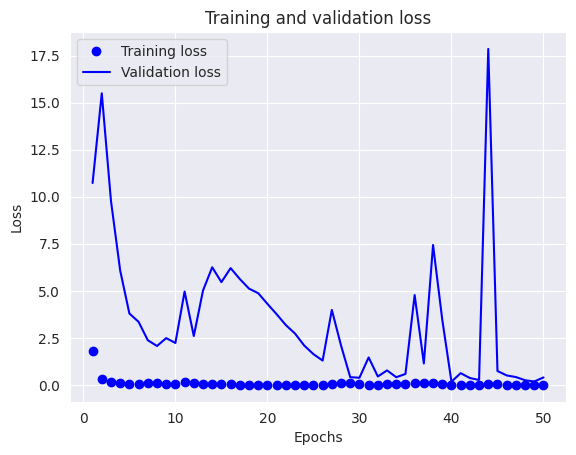

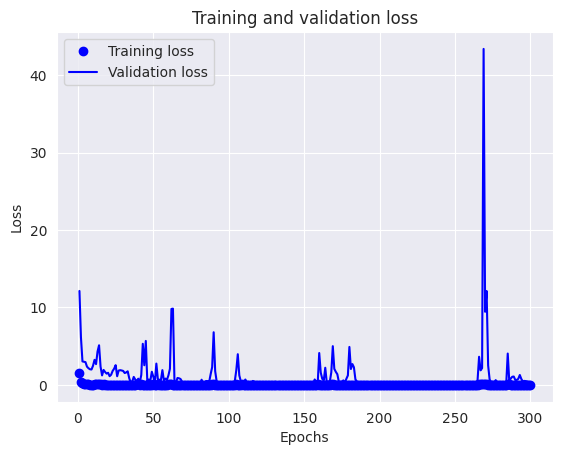

In [11]:
show_history_plot(history_50.history)
show_history_plot(history_300.history)

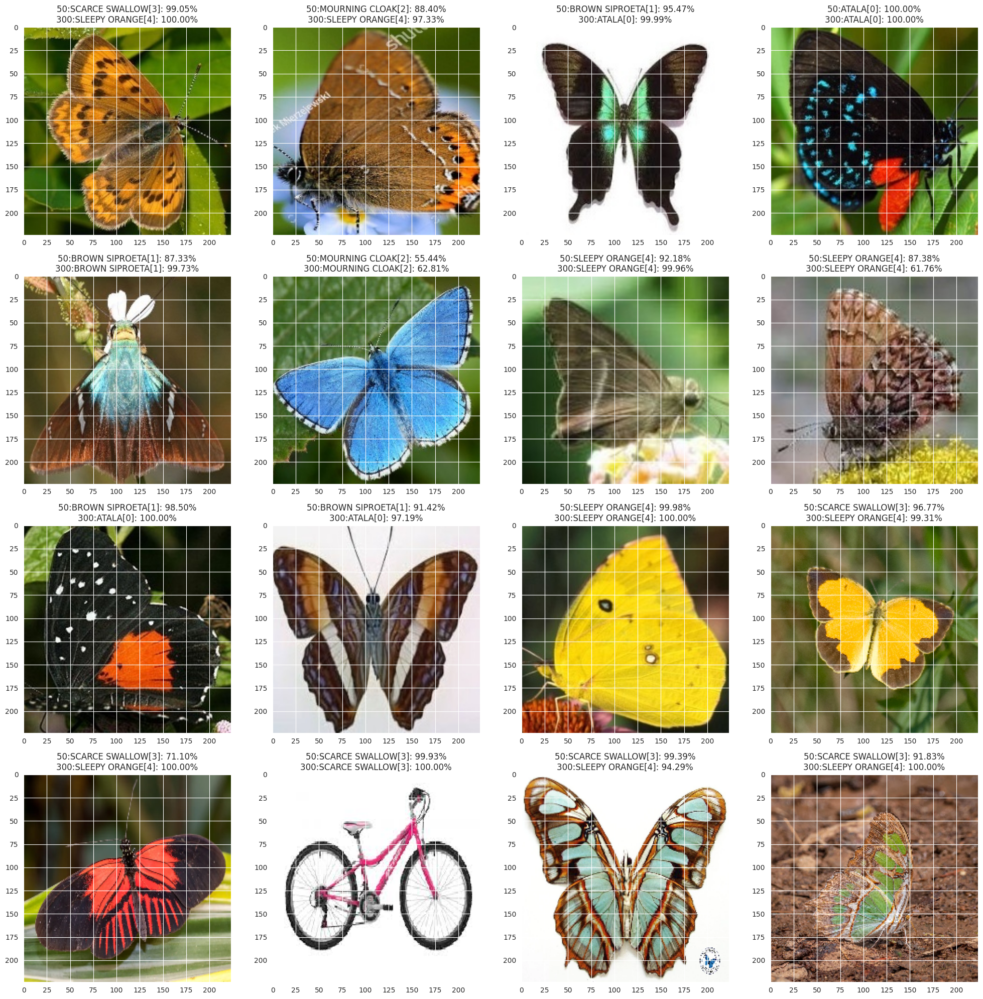

In [12]:
imgs = os.listdir('test')
_, axes = plt.subplots(math.ceil(len(imgs) / 4), 4, figsize=(20, math.ceil(len(imgs) / 4) * 5))
axes = axes.flatten()
for ind, filename in enumerate(imgs):
    img = keras.utils.load_img(f"test/{filename}", target_size=(224, 224))
    axes[ind].imshow(img)
    img_array = keras.utils.img_to_array(img)
    img_array = keras.ops.expand_dims(img_array, 0)  # Create batch axis
    predictions_50 = model_50.predict(img_array, verbose=0)
    predictions_300 = model_300.predict(img_array, verbose=0)
    title = f"50:{df[['encoded', 'label']].drop_duplicates().sort_values('encoded')['label'].values[int(np.argmax(predictions_50))]}[{np.argmax(predictions_50)}]: {np.max(predictions_50) * 100:.2f}%\n"+\
            f"300:{df[['encoded', 'label']].drop_duplicates().sort_values('encoded')['label'].values[int(np.argmax(predictions_300))]}[{np.argmax(predictions_300)}]: {np.max(predictions_300) * 100:.2f}%"
    axes[ind].set_title(title)

plt.tight_layout()
plt.show()

### 2.2. З тренуванням за допомогою інших нейромереж

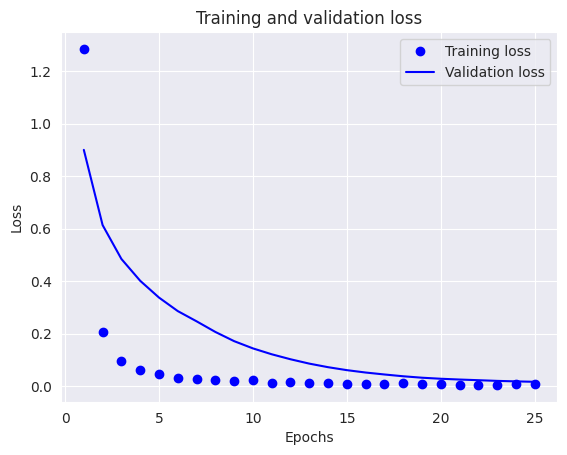

In [13]:
inputs = layers.Input(shape=(224, 224, 3))
model = EfficientNetB0(include_top=False, input_tensor=inputs, weights='imagenet')
model.trainable = False
x = layers.GlobalAveragePooling2D()(model.output)
x = layers.BatchNormalization()(x)

x = layers.Dropout(0.25)(x)
outputs = layers.Dense(5, activation='softmax')(x)

model = keras.Model(inputs=inputs, outputs=outputs, name='EfficientNetB0PreTrained')

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
history_ptr = model.fit(x=train_ds, validation_data=val_ds, epochs=25, verbose=0, callbacks=[ModelCheckpoint("butterflies_pretrained_25_epochs.keras")])

show_history_plot(history_ptr.history)

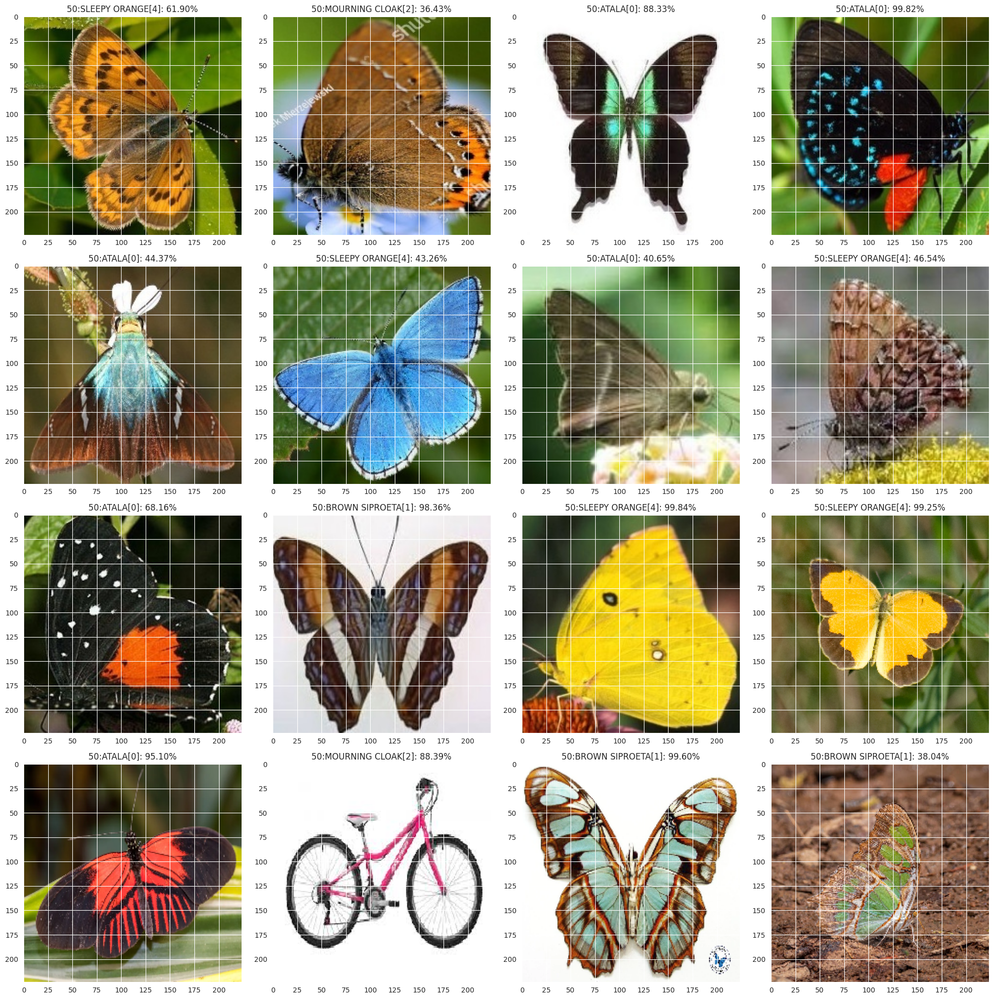

In [14]:
imgs = os.listdir('test')
_, axes = plt.subplots(math.ceil(len(imgs) / 4), 4, figsize=(20, math.ceil(len(imgs) / 4) * 5))
axes = axes.flatten()
for ind, filename in enumerate(imgs):
    img = keras.utils.load_img(f"test/{filename}", target_size=(224, 224))
    axes[ind].imshow(img)
    img_array = keras.utils.img_to_array(img)
    img_array = keras.ops.expand_dims(img_array, 0)  # Create batch axis
    predictions = model.predict(img_array, verbose=0)
    title = f"50:{df[['encoded', 'label']].drop_duplicates().sort_values('encoded')['label'].values[int(np.argmax(predictions))]}[{np.argmax(predictions)}]: {np.max(predictions) * 100:.2f}%"
    axes[ind].set_title(title)

plt.tight_layout()
plt.show()

### 3. RNN
#### 3.1. From scratch

In [15]:
import re, string
import inflect

from nltk.corpus import stopwords

# Initialize inflect engine
p = inflect.engine()
df = pd.DataFrame(pd.read_csv('../lb2/gender_tweets.csv'))[['gender', 'text']]

df.dropna(inplace=True, ignore_index=True)

# Function to convert ordinal string to words
def ordinal_to_words(ordinal_str):
    match = re.match(r"(\d+)(st|nd|rd|th)", ordinal_str)
    number = int(match.group(1))
    # Convert number to ordinal words
    return p.number_to_words(p.ordinal(number))


stopw = set(stopwords.words("english"))
stopw.update({"one", "time", "love", "u"})

def preprocess(transformer: str) -> str:
    transformer = transformer.lower()

    transformer = re.sub(r"https*\S+", " ", transformer)
    transformer = re.sub(r"^([a-zA-Z0-9_\-.]+)@([a-zA-Z0-9_\-]+)(\.[a-zA-Z]{2,5}){1,2}$", " ", transformer)
    transformer = re.sub(r"@\S+", " ", transformer)
    transformer = re.sub(r"#\S+", " ", transformer)
    if re.match(r"(\d+)(st|nd|rd|th)", transformer):
        transformer = re.sub(r"(\d+)(st|nd|rd|th)", ordinal_to_words(transformer), transformer)
    transformer = re.sub(r"&amp;", " ", transformer)
    transformer = re.sub(r"&gt;", " ", transformer)
    transformer = re.sub(r"&lt;", " ", transformer)
    transformer = re.sub(r"-", " ", transformer)
    transformer = re.sub(r"\d", " ", transformer)
    transformer = re.sub(r"�۪", " ", transformer)
    transformer = re.sub(r"[٪ή]", " ", transformer)
    transformer = re.sub(r"ٍ", " ", transformer)
    transformer = re.sub(r"[�۝ُԍϭջωԏե]", " ", transformer)
    transformer = re.sub("[%s]" % re.escape(string.punctuation), " ", transformer)
    transformer = re.sub(r"\s{2,}", " ", transformer)
    transformer = ' '.join([word for word in transformer.split(' ') if word not in stopw])
    return transformer.strip()

df_copy = df.copy()

df_copy['text'] = df_copy['text'].apply(preprocess)

df_copy

,gender,text
0,male,robbie e responds critics win eddie edwards
1,male,felt like friends living story
2,male,absolutely adore louis starts songs hits hard ...
3,male,hi looking url use typically see advanced user
4,female,watching neighbours sky catching neighbs xxx xxx
...,...,...
19948,female,fine drink tea
19949,male,greg hardy good player get face dez bryant lea...
19950,male,miss people still never want see
19951,female,noticed tendency pee carpet want say anything p


In [30]:
import tensorflow as tf

# Extract text and labels
x_t = df_copy['text'].values
df_copy[df_copy['gender'] == 'unknown'] = 'brand'
y = df_copy['gender'].values

# Encode the labels into integers
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Split into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x_t, y, test_size=0.1, random_state=42)

print('Train number:', len(x_train))
print('Test number:', len(x_test))

# Create TensorFlow Dataset
batch_size = 32
train_dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train))
train_dataset = train_dataset.shuffle(buffer_size=len(x_train)).batch(batch_size).prefetch(tf.data.AUTOTUNE)

# Test dataset
test_dataset = tf.data.Dataset.from_tensor_slices((x_test, y_test))
test_dataset = test_dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
vocab_size = 10000
layer = keras.layers.TextVectorization(max_tokens=vocab_size, standardize=None, output_mode="tf_idf")

Train number: 17957
Test number: 1996


In [31]:
# створення словника
text_only = train_dataset.map(lambda txt, lbl: txt)
layer.adapt(text_only)

In [32]:
inputs = keras.layers.Input(shape=(1,), dtype=tf.string)
x = layer(inputs)
x = layers.Embedding(vocab_size, 128)(x)
x = layers.LSTM(128)(x)

# We add a vanilla hidden layer:
x = layers.Dense(64, activation="relu")(x)

# We project onto a single unit output layer, and squash it with a sigmoid:
predictions = layers.Dense(3, activation="softmax")(x)

model = keras.Model(inputs, predictions)

# Compile the model with binary crossentropy loss and an adam optimizer.
model.compile(loss="sparse_categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

In [33]:
model.summary()

Model: "functional_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_24 (InputLayer)     │ (None, 1)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ text_vectorization_2            │ (None, 10000)          │             0 │
│ (TextVectorization)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding_3 (Embedding)         │ (None, 10000, 128)     │     1,280,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 128)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_105 (Dense)               │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,420,035 (5.42 MB)

 Trainable params: 1,420,035 (5.42 MB)

 Non-trainable params: 0 (0.00 B)

In [36]:
epochs = 5
hist_no_training = model.fit(train_dataset, validation_data=test_dataset, epochs=epochs)

Epoch 1/5
562/562 ━━━━━━━━━━━━━━━━━━━━ 366s 651ms/step - accuracy: 0.3556 - loss: 1.0972 - val_accuracy: 0.3507 - val_loss: 1.0975
Epoch 2/5
562/562 ━━━━━━━━━━━━━━━━━━━━ 376s 670ms/step - accuracy: 0.3537 - loss: 1.0975 - val_accuracy: 0.3507 - val_loss: 1.0979
Epoch 3/5
562/562 ━━━━━━━━━━━━━━━━━━━━ 388s 690ms/step - accuracy: 0.3593 - loss: 1.0964 - val_accuracy: 0.3507 - val_loss: 1.0975
Epoch 4/5
562/562 ━━━━━━━━━━━━━━━━━━━━ 383s 681ms/step - accuracy: 0.3573 - loss: 1.0974 - val_accuracy: 0.3507 - val_loss: 1.0976
Epoch 5/5
562/562 ━━━━━━━━━━━━━━━━━━━━ 368s 655ms/step - accuracy: 0.3558 - loss: 1.0973 - val_accuracy: 0.3507 - val_loss: 1.0975


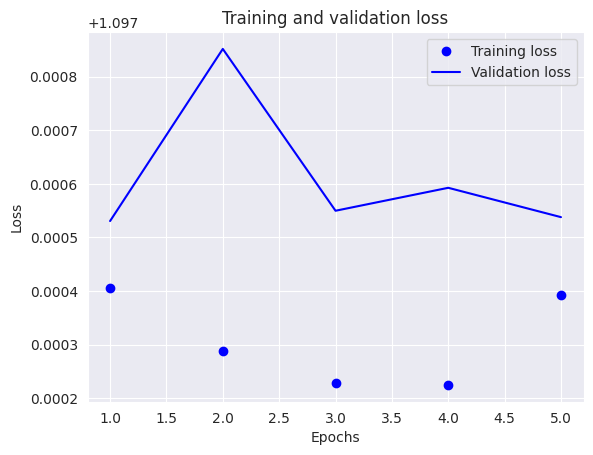

In [38]:
show_history_plot(hist_no_training.history)

### Точність погана в порівнянні з CNN (CNN > LSTM десь на 20%, хоч в абсолютних значеннях це 0.42 проти 0.35)

#### 3.2. Pre-trained Embeddings

In [47]:
import numpy as np

# Path to the pre-trained GloVe file
glove_file = "glove.6B.100d.txt"  # Example file: 100-dimensional GloVe

# Load GloVe embeddings into a dictionary
embedding_index = {}
with open(glove_file, encoding='utf-8') as f:
    for line in f:
        values = line.split()
        word = values[0]
        embedding_vector = np.asarray(values[1:], dtype='float32')
        embedding_index[word] = embedding_vector

print(f"Loaded {len(embedding_index)} word vectors.")

Loaded 400000 word vectors.


In [49]:
vocab_size = layer.vocabulary_size()
vocab = layer.get_vocabulary()

# Create an embedding matrix
embedding_dim = 100  # Dimension of pre-trained embeddings (e.g., GloVe 100d)
embedding_matrix = np.zeros((vocab_size, embedding_dim))

# Populate the embedding matrix with pre-trained vectors
for i, word in enumerate(vocab):
    if word in embedding_index:
        embedding_matrix[i] = embedding_index[word]
    else:
        # Words not found in pre-trained embeddings will have a zero vector
        embedding_matrix[i] = np.random.normal(size=(embedding_dim,))

print(f"Embedding matrix shape: {embedding_matrix.shape}")


Embedding matrix shape: (10000, 100)


In [50]:
# Create an embedding layer
embedding_layer = layers.Embedding(
    input_dim=vocab_size,
    output_dim=embedding_dim,
    weights=[embedding_matrix],
    trainable=False
)


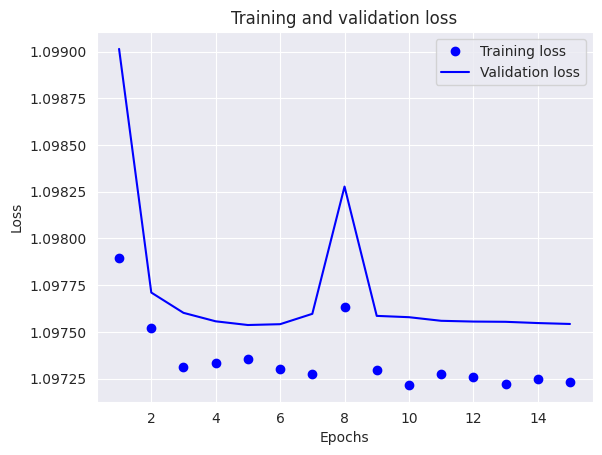

In [55]:
inputs = keras.layers.Input(shape=(1,), dtype=tf.string)
x = layer(inputs)
x = layers.Embedding(vocab_size, 128)(x)
x = layers.LSTM(128)(x)

# We add a vanilla hidden layer:
x = layers.Dense(64, activation="relu")(x)

# We project onto a single unit output layer, and squash it with a sigmoid:
predictions = layers.Dense(3, activation="softmax")(x)

model = keras.Model(inputs, predictions)

# Compile the model with binary crossentropy loss and an adam optimizer.
model.compile(loss="sparse_categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

epochs = 15
hist = model.fit(train_dataset, validation_data=test_dataset, epochs=epochs, verbose=0)

show_history_plot(hist.history)

In [58]:
train_dataset.element_spec

(TensorSpec(shape=(None,), dtype=tf.string, name=None),
 TensorSpec(shape=(None,), dtype=tf.int64, name=None))